In [1]:
import pandas as pd
import pickle
import eli5
import numpy as np


# Look at the locations of wells:

In [2]:
labs =['Train','Validation','Test']
dfs = {}
for l in labs:
    df = pd.read_pickle(f'../data/final/{l}_final.pck')
    print(df.shape)
    dfs[l] = df
test_wells = pd.read_csv(f'../data/raw/regression_sample_submission_test.txt')['EPAssetsId']
dfs['Test'] = dfs['Test'].loc[ dfs['Test']['EPAssetsId'].isin(test_wells),:] 

df_all_regr = pd.concat(list(dfs.values()),axis = 0,keys=list(dfs.keys()))
df_all_regr['key'] = df_all_regr.index.get_level_values(0)


(6256, 55)
(1329, 55)
(1406, 51)


/home/anton/miniconda3/envs/pg_model/lib/python3.7/site-packages/ipykernel_launcher.py:10: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  # Remove the CWD from sys.path while we load stuff.


In [5]:
labs =['Train','Validation','Test']
dfs = {}
for l in labs:# /home/anton/Repos/untapped-nrj-classification/data/final/Train_final.pck
    df = pd.read_pickle(f'/home/anton/Repos/untapped-nrj-classification/data/final/{l}_final.pck')
    print(df.shape)
    dfs[l] = df
test_wells = pd.read_csv(f'/home/anton/Repos/untapped-nrj-classification/data/raw/classification_sample_submission_test.txt')['EPAssetsId']
dfs['Test'] = dfs['Test'].loc[ dfs['Test']['EPAssetsId'].isin(test_wells),:] 
df_all_class = pd.concat(list(dfs.values()),axis = 0,keys=list(dfs.keys()))
df_all_class['key'] = df_all_class.index.get_level_values(0)

print(df_all_class.shape)

(588673, 32)
(132131, 32)
(118076, 30)
(838880, 33)


/home/anton/miniconda3/envs/pg_model/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  if __name__ == '__main__':


In [6]:
import altair as alt
alt.renderers.enable('notebook')
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

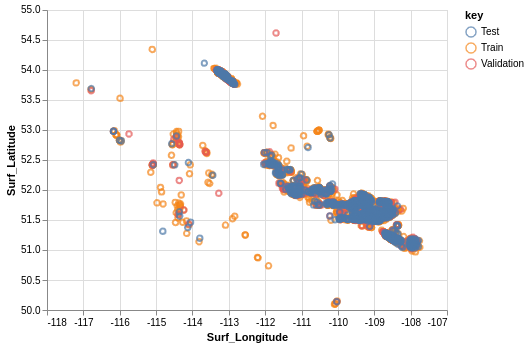

In [7]:
alt.Chart(data=df_all_regr.reset_index()).encode(x=alt.Longitude('Surf_Longitude',scale=alt.Scale(zero=False)),y=alt.Latitude('Surf_Latitude',scale=alt.Scale(zero=False)),color='key').mark_point()

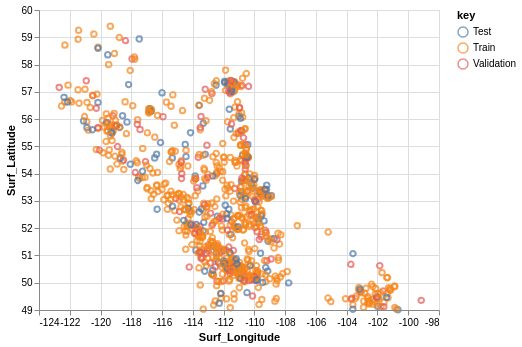

In [8]:
alt.Chart(data=df_all_class.sample(frac=0.001).reset_index()).encode(x=alt.Longitude('Surf_Longitude',scale=alt.Scale(zero=False)),y=alt.Latitude('Surf_Latitude',scale=alt.Scale(zero=False)),color='key').mark_point()

# Look at the overlaps

In [9]:
df_all_regr['UWI']

Train  0         191070303025W300
       1         100053003504W400
       2         192102403024W300
       3         100091003608W400
       4         101101602619W300
                       ...       
Test   117794    191152502620W300
       117910    102141503424W300
       117924    192151703021W300
       117951    192130503023W300
       117983    191053403219W300
Name: UWI, Length: 8991, dtype: object

In [10]:
df_all_class['UWI'].head()

Train  0    100121804916W502
       1    100011505407W400
       2    111023105022W300
       3    100102103701W400
       4    100163008216W600
Name: UWI, dtype: object

In [11]:
idx = df_all_regr['UWI'].isin(df_all_class['UWI'])

In [12]:
df_new = pd.merge(df_all_regr,df_all_class[['UWI','well_status']])
idx_test = (df_new['key'] == "Test")
df_new[idx_test]['well_status']


7588    NaN
7589    NaN
7590    NaN
7591    NaN
7592    NaN
       ... 
8989    NaN
8990    NaN
8991    NaN
8992    NaN
8993    NaN
Name: well_status, Length: 1406, dtype: object

In [49]:
(5+1) //2

3